In [3]:
import requests
import json
import pandas as pd
import numpy as np
import re
import csv
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_columns', 500)

## Bring in previously-pulled reports for Marketing job listings for TN and TX

Took sample of 4000 listings from each site

Concat vertically into one dataframe

In [4]:
marketing_tn = pd.read_json('data/marketing_tn.json')
#marketing_tn

In [5]:
marketing_tx = pd.read_json('data/marketing_tx.json')
#marketing_tx.data[0]

In [6]:
marketing_concat = pd.concat([marketing_tn, marketing_tx], ignore_index=True)


In [7]:
marketing_concat.shape

(8000, 7)

Clean data column and convert specific key:value pairs into columns

In [8]:
type(marketing_concat)

pandas.core.frame.DataFrame

In [9]:
marketing_concat.columns

Index(['recordsFiltered', 'recordsTotal', 'data', 'draw', 'success',
       'elapsedSeconds', 'results'],
      dtype='object')

In [10]:
marketing_concat = marketing_concat.drop(columns=['recordsFiltered', 'recordsTotal','draw', 'success', 'elapsedSeconds', 'results'])

In [11]:
marketing_concat.data[0]

{'keyword': 'Marketing',
 'zipcity': None,
 'jobdescription_snippet': ' ... <span class="highlight_keyword">Marketing</span> Partner | <span class="highlight_keyword">Marketing</span> Technology & Operations Senior Professional Job Description As a Senior <span class="highlight_keyword">Marketing</span> Partner in <span class="highlight_keyword">Marketing</span> Technology & Operations, you will serve as the business owner of <span class="highlight_keyword">Marketing</span>\'s key demand generation and lead generation systems, specifically our <span class="highlight_keyword">marketing</span> automation platform and the <span class="highlight_keyword">marketing</span> aspects of our CRM platform. You will also partner closely with other technology leaders in <span class="highlight_keyword">marketing</span> to support initiatives and provide applicable expertise across all core platforms including web content management, digital asset management, operations management, and event manageme

In [12]:
marketing_concat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   data    8000 non-null   object
dtypes: object(1)
memory usage: 62.6+ KB


In [13]:
marketing_concat.dropna(inplace = True) 

In [14]:
marketing_concat.shape

(8000, 1)

In [15]:
job_list = marketing_concat["data"].tolist()

In [16]:
job_list

[{'keyword': 'Marketing',
  'zipcity': None,
  'jobdescription_snippet': ' ... <span class="highlight_keyword">Marketing</span> Partner | <span class="highlight_keyword">Marketing</span> Technology & Operations Senior Professional Job Description As a Senior <span class="highlight_keyword">Marketing</span> Partner in <span class="highlight_keyword">Marketing</span> Technology & Operations, you will serve as the business owner of <span class="highlight_keyword">Marketing</span>\'s key demand generation and lead generation systems, specifically our <span class="highlight_keyword">marketing</span> automation platform and the <span class="highlight_keyword">marketing</span> aspects of our CRM platform. You will also partner closely with other technology leaders in <span class="highlight_keyword">marketing</span> to support initiatives and provide applicable expertise across all core platforms including web content management, digital asset management, operations management, and event manag

In [17]:
type(job_list)

list

In [18]:
category = [d["keyword"] for d in job_list]
city = [d["city"] for d in job_list]
state = [d["state"] for d in job_list]
job_titles = [d["jobtitle"] for d in job_list]
#Will include employer for now to help identify duplicates, but will drop later
employer = [d.get('employer') for d in job_list]  #use this format if there will be NaNs.  
snippet = [d["jobdescription_snippet"] for d in job_list]
job_descriptions = [d["jobdescription"] for d in job_list]
# min_sal = [d.get('minsal') for d in job_list]  
# max_sal = [d.get('maxsal') for d in job_list]  



In [19]:
job_descriptions

[' 74962BR Senior <span class="highlight_keyword">Marketing</span> Partner | <span class="highlight_keyword">Marketing</span> Technology & Operations Senior Professional Job Description As a Senior <span class="highlight_keyword">Marketing</span> Partner in <span class="highlight_keyword">Marketing</span> Technology & Operations, you will serve as the business owner of <span class="highlight_keyword">Marketing</span>\'s key demand generation and lead generation systems, specifically our <span class="highlight_keyword">marketing</span> automation platform and the <span class="highlight_keyword">marketing</span> aspects of our CRM platform. You will also partner closely with other technology leaders in <span class="highlight_keyword">marketing</span> to support initiatives and provide applicable expertise across all core platforms including web content management, digital asset management, operations management, and event management. This position will report to the Senior Manager, <span

In [20]:
state

['TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',
 'TN',

In [21]:
employer

['Cerner Corporation',
 'Community Health Systems, Inc.',
 'Gaylord Hotels',
 'Marriott International, Inc.',
 'Hospital Corporation of America',
 'Not Available',
 "St. Jude Children's Research Hospital Inc.",
 'Ballad Health',
 'Orion Federal Credit Union',
 'Not Available',
 "St. Jude Children's Research Hospital Inc.",
 'Not Available',
 'Not Available',
 'Not Available',
 'CareHarmony',
 'HarperCollins Publishers, Inc.',
 'Florim USA',
 'Not Available',
 'Gannett Co., Inc.',
 'Newport Healthcare',
 'Not Available',
 'Gannett Co., Inc.',
 'HealthStream, Inc.',
 'Methodist Le Bonheur Healthcare',
 'Sonepar USA',
 'Irby Co.',
 'Not available',
 'Veeam Software Corporation',
 'JumpCrew LLC',
 'Gannett Co., Inc.',
 'HealthStream, Inc.',
 'Not Available',
 'Vanderbilt University Medical Center',
 'HarperCollins Publishers, Inc.',
 'The University of Tennessee Knoxville',
 'Stream Realty Partners, LP',
 'Pearson Education, Inc.',
 'Appriss, Inc.',
 'Cirrus Aircraft Corporation',
 'ARGO',

In [22]:
marketing = pd.DataFrame()
marketing['category'] = category
marketing['state'] = state
marketing['title'] = job_titles
marketing['employer'] = employer
marketing['city'] = city
marketing['snippet'] = snippet
marketing['full_description'] = job_descriptions
# bluecollar['min_pay'] = min_sal
# bluecollar['max_pay'] = max_sal

print(marketing)


       category state                                              title  \
0     Marketing    TN  Senior <span class="highlight_keyword">Marketi...   
1     Marketing    TN  <span class="highlight_keyword">Marketing</spa...   
2     Marketing    TN  Sr. <span class="highlight_keyword">Marketing<...   
3     Marketing    TN  Sr. <span class="highlight_keyword">Marketing<...   
4     Marketing    TN  AVP of <span class="highlight_keyword">Marketi...   
...         ...   ...                                                ...   
7995  Marketing    TX                         Associate Project Manager    
7996  Marketing    TX                             District Sales Manager   
7997  Marketing    TX      Legal Systems Administrator - Workfront 96621   
7998  Marketing    TX                         Hospital Home Care Liaison   
7999  Marketing    TX                 Elementary School Teacher - 77381    

                             employer           city  \
0                  Cerner Corpo

Remove the brackets with "highlight keyword" and "span", and \\n

In [23]:
marketing['title'] = marketing['title'].apply(lambda x: re.sub(r'<.*?>','', str(x)))

In [24]:
marketing['snippet'] = marketing['snippet'].apply(lambda x: re.sub(r'<.*?>','', str(x)))

In [25]:
marketing['full_description'] =  marketing['full_description'].apply(lambda x: re.sub(r'<.*?>','', str(x)))

In [26]:
marketing['full_description'] =  marketing['full_description'].apply(lambda x: re.sub(r'\\n','', str(x)))

In [27]:
marketing['snippet'] =  marketing['snippet'].apply(lambda x: re.sub(r'\\n','', str(x)))

In [28]:
marketing

,category,state,title,employer,city,snippet,full_description
0,Marketing,TN,Senior Marketing Partner | Marketing Technolog...,Cerner Corporation,Memphis,... Marketing Partner | Marketing Technology ...,74962BR Senior Marketing Partner | Marketing ...
1,Marketing,TN,Marketing Coordinator,"Community Health Systems, Inc.",Franklin,... Marketing Coordinator is primarily respon...,The Marketing Coordinator is primarily respons...
2,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,Gaylord Hotels,Nashville,... Marketing Manager – Gaylord Hotels plays ...,JOB SUMMARY The Sr. Marketing Manager – Gaylor...
3,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,"Marriott International, Inc.",Nashville,... Marketing Manager â€“ Gaylord Hotels play...,JOB SUMMARY The Sr. Marketing Manager â€“ Gayl...
4,Marketing,TN,AVP of Marketing Florida Division,Hospital Corporation of America,Nashville,"... Marketing? At HCA Healthcare, you come fi...",Description Introduction Do you want to join ...
...,...,...,...,...,...,...,...
7995,Marketing,TX,Associate Project Manager,"PERKINS COIE, LLP",DALLAS,"... marketing, finance, practice management. ...","Job Description: At Perkins Coie, we look for..."
7996,Marketing,TX,District Sales Manager,SAFETY-KLEEN SYSTEMS INC,Houston,... marketing plans in alignment with the Reg...,Position Description: The Opportunity Safety-...
7997,Marketing,TX,Legal Systems Administrator - Workfront 96621,ADVANCED MICRO DEVICES INC,Austin,"... marketing, and corporate finance. We file...","What you do at AMD changes everything At AMD,..."
7998,Marketing,TX,Hospital Home Care Liaison,ZETA HOME HEALTH CARE INC,Greenville,"... marketing materials, etc. Regularly trave...",Hospital Home Care Liaison Requisition ID 202...


In [29]:
marketing = marketing.drop_duplicates(keep='last')

In [30]:
marketing.shape

(7571, 7)

Now, identify keywords that could imply criticality of finding talent, search the job snippet and job description fields, and count the number of times the keywords appear

Run the keywords against "full job description".  Note that the keywords were also run against the "job snippet" column
but the total counts were less than the full job description counts, so the snippet column was removed.

In [31]:
import string
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\daily\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\daily\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


And then run the words against the "full_description"

In [32]:
# def preprocess_text(full_description):
#     full_description = full_description.lower() # To lower
#     translator = str.maketrans('', '', string.punctuation)
#     full_description = full_description.translate(translator) # Removing punctuation
#     filtered_words = [w for w in full_description.split() if w not in stopwords.words('english')] # Removing stopwords from the tokenized text
#     return ' '.join(filtered_words) # We return the resulting list as a string

#trying to include 'no experience necessary by removing "no" from stopwords'
def preprocess_text(full_description):
    full_description = full_description.lower() 
    translator = str.maketrans('', '', string.punctuation)
    full_description = full_description.translate(translator)
    stop_words = set(stopwords.words('english'))
    not_stopwords = {'no'}
    final_stopwords = set([word for word in stop_words if word not in not_stopwords])
    filtered_words = [w for w in full_description.split() if w not in final_stopwords] 
    return ' '.join(filtered_words) 


In [33]:
KEYWORDS = ['bonus', 'bonuses','pay increase', 'pay increases', 'immediately', 'incentive', 'incentives', 'no experience necessary']

def count_keywords(full_description):
    counts = {}
    prep = preprocess_text(full_description)
    for kw in KEYWORDS:
        counts[kw] = prep.count(kw)
    return counts

# remove these keywords for test run: 'bonus', 'bonuses','pay increase', 'immediately',

In [34]:
marketing['occur_full_desc'] = marketing['full_description'].apply(count_keywords)

<ipython-input-34-b8a28db99106>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  marketing['occur_full_desc'] = marketing['full_description'].apply(count_keywords)


In [35]:
marketing

,category,state,title,employer,city,snippet,full_description,occur_full_desc
0,Marketing,TN,Senior Marketing Partner | Marketing Technolog...,Cerner Corporation,Memphis,... Marketing Partner | Marketing Technology ...,74962BR Senior Marketing Partner | Marketing ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
1,Marketing,TN,Marketing Coordinator,"Community Health Systems, Inc.",Franklin,... Marketing Coordinator is primarily respon...,The Marketing Coordinator is primarily respons...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
2,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,Gaylord Hotels,Nashville,... Marketing Manager – Gaylord Hotels plays ...,JOB SUMMARY The Sr. Marketing Manager – Gaylor...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
3,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,"Marriott International, Inc.",Nashville,... Marketing Manager â€“ Gaylord Hotels play...,JOB SUMMARY The Sr. Marketing Manager â€“ Gayl...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
4,Marketing,TN,AVP of Marketing Florida Division,Hospital Corporation of America,Nashville,"... Marketing? At HCA Healthcare, you come fi...",Description Introduction Do you want to join ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
...,...,...,...,...,...,...,...,...
7995,Marketing,TX,Associate Project Manager,"PERKINS COIE, LLP",DALLAS,"... marketing, finance, practice management. ...","Job Description: At Perkins Coie, we look for...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
7996,Marketing,TX,District Sales Manager,SAFETY-KLEEN SYSTEMS INC,Houston,... marketing plans in alignment with the Reg...,Position Description: The Opportunity Safety-...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
7997,Marketing,TX,Legal Systems Administrator - Workfront 96621,ADVANCED MICRO DEVICES INC,Austin,"... marketing, and corporate finance. We file...","What you do at AMD changes everything At AMD,...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ..."
7998,Marketing,TX,Hospital Home Care Liaison,ZETA HOME HEALTH CARE INC,Greenville,"... marketing materials, etc. Regularly trave...",Hospital Home Care Liaison Requisition ID 202...,"{'bonus': 1, 'bonuses': 0, 'pay increase': 0, ..."


In [36]:
full_desc_incent = marketing.occur_full_desc.tolist()

In [37]:
pd.DataFrame(full_desc_incent)

,bonus,bonuses,pay increase,pay increases,immediately,incentive,incentives,no experience necessary
0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
7566,0,0,0,0,0,0,0,0
7567,0,0,0,0,0,0,0,0
7568,0,0,0,0,0,0,0,0
7569,1,0,0,0,0,1,0,0


In [38]:
type(marketing)

pandas.core.frame.DataFrame

In [39]:
marketing3 = pd.concat([marketing, pd.DataFrame(full_desc_incent)], axis=1)

In [40]:
marketing3.head(2)

,category,state,title,employer,city,snippet,full_description,occur_full_desc,bonus,bonuses,pay increase,pay increases,immediately,incentive,incentives,no experience necessary
0,Marketing,TN,Senior Marketing Partner | Marketing Technolog...,Cerner Corporation,Memphis,... Marketing Partner | Marketing Technology ...,74962BR Senior Marketing Partner | Marketing ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Marketing,TN,Marketing Coordinator,"Community Health Systems, Inc.",Franklin,... Marketing Coordinator is primarily respon...,The Marketing Coordinator is primarily respons...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [41]:
marketing3['bonus_ttl'] = marketing3['bonus'] + marketing3['bonuses']
marketing3

,category,state,title,employer,city,snippet,full_description,occur_full_desc,bonus,bonuses,pay increase,pay increases,immediately,incentive,incentives,no experience necessary,bonus_ttl
0,Marketing,TN,Senior Marketing Partner | Marketing Technolog...,Cerner Corporation,Memphis,... Marketing Partner | Marketing Technology ...,74962BR Senior Marketing Partner | Marketing ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Marketing,TN,Marketing Coordinator,"Community Health Systems, Inc.",Franklin,... Marketing Coordinator is primarily respon...,The Marketing Coordinator is primarily respons...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,Gaylord Hotels,Nashville,... Marketing Manager – Gaylord Hotels plays ...,JOB SUMMARY The Sr. Marketing Manager – Gaylor...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,"Marriott International, Inc.",Nashville,... Marketing Manager â€“ Gaylord Hotels play...,JOB SUMMARY The Sr. Marketing Manager â€“ Gayl...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Marketing,TN,AVP of Marketing Florida Division,Hospital Corporation of America,Nashville,"... Marketing? At HCA Healthcare, you come fi...",Description Introduction Do you want to join ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,Marketing,TX,Associate Project Manager,"PERKINS COIE, LLP",DALLAS,"... marketing, finance, practice management. ...","Job Description: At Perkins Coie, we look for...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7996,Marketing,TX,District Sales Manager,SAFETY-KLEEN SYSTEMS INC,Houston,... marketing plans in alignment with the Reg...,Position Description: The Opportunity Safety-...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7997,Marketing,TX,Legal Systems Administrator - Workfront 96621,ADVANCED MICRO DEVICES INC,Austin,"... marketing, and corporate finance. We file...","What you do at AMD changes everything At AMD,...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7998,Marketing,TX,Hospital Home Care Liaison,ZETA HOME HEALTH CARE INC,Greenville,"... marketing materials, etc. Regularly trave...",Hospital Home Care Liaison Requisition ID 202...,"{'bonus': 1, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
marketing3['incentive_ttl'] = marketing3['incentive'] + marketing3['incentives']
marketing3

,category,state,title,employer,city,snippet,full_description,occur_full_desc,bonus,bonuses,pay increase,pay increases,immediately,incentive,incentives,no experience necessary,bonus_ttl,incentive_ttl
0,Marketing,TN,Senior Marketing Partner | Marketing Technolog...,Cerner Corporation,Memphis,... Marketing Partner | Marketing Technology ...,74962BR Senior Marketing Partner | Marketing ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Marketing,TN,Marketing Coordinator,"Community Health Systems, Inc.",Franklin,... Marketing Coordinator is primarily respon...,The Marketing Coordinator is primarily respons...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,Gaylord Hotels,Nashville,... Marketing Manager – Gaylord Hotels plays ...,JOB SUMMARY The Sr. Marketing Manager – Gaylor...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,"Marriott International, Inc.",Nashville,... Marketing Manager â€“ Gaylord Hotels play...,JOB SUMMARY The Sr. Marketing Manager â€“ Gayl...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Marketing,TN,AVP of Marketing Florida Division,Hospital Corporation of America,Nashville,"... Marketing? At HCA Healthcare, you come fi...",Description Introduction Do you want to join ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,Marketing,TX,Associate Project Manager,"PERKINS COIE, LLP",DALLAS,"... marketing, finance, practice management. ...","Job Description: At Perkins Coie, we look for...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7996,Marketing,TX,District Sales Manager,SAFETY-KLEEN SYSTEMS INC,Houston,... marketing plans in alignment with the Reg...,Position Description: The Opportunity Safety-...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7997,Marketing,TX,Legal Systems Administrator - Workfront 96621,ADVANCED MICRO DEVICES INC,Austin,"... marketing, and corporate finance. We file...","What you do at AMD changes everything At AMD,...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7998,Marketing,TX,Hospital Home Care Liaison,ZETA HOME HEALTH CARE INC,Greenville,"... marketing materials, etc. Regularly trave...",Hospital Home Care Liaison Requisition ID 202...,"{'bonus': 1, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [43]:
marketing3['increase_ttl'] = marketing3['pay increase'] + marketing3['pay increases']
marketing3

,category,state,title,employer,city,snippet,full_description,occur_full_desc,bonus,bonuses,pay increase,pay increases,immediately,incentive,incentives,no experience necessary,bonus_ttl,incentive_ttl,increase_ttl
0,Marketing,TN,Senior Marketing Partner | Marketing Technolog...,Cerner Corporation,Memphis,... Marketing Partner | Marketing Technology ...,74962BR Senior Marketing Partner | Marketing ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Marketing,TN,Marketing Coordinator,"Community Health Systems, Inc.",Franklin,... Marketing Coordinator is primarily respon...,The Marketing Coordinator is primarily respons...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,Gaylord Hotels,Nashville,... Marketing Manager – Gaylord Hotels plays ...,JOB SUMMARY The Sr. Marketing Manager – Gaylor...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,"Marriott International, Inc.",Nashville,... Marketing Manager â€“ Gaylord Hotels play...,JOB SUMMARY The Sr. Marketing Manager â€“ Gayl...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Marketing,TN,AVP of Marketing Florida Division,Hospital Corporation of America,Nashville,"... Marketing? At HCA Healthcare, you come fi...",Description Introduction Do you want to join ...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,Marketing,TX,Associate Project Manager,"PERKINS COIE, LLP",DALLAS,"... marketing, finance, practice management. ...","Job Description: At Perkins Coie, we look for...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7996,Marketing,TX,District Sales Manager,SAFETY-KLEEN SYSTEMS INC,Houston,... marketing plans in alignment with the Reg...,Position Description: The Opportunity Safety-...,"{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7997,Marketing,TX,Legal Systems Administrator - Workfront 96621,ADVANCED MICRO DEVICES INC,Austin,"... marketing, and corporate finance. We file...","What you do at AMD changes everything At AMD,...","{'bonus': 0, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7998,Marketing,TX,Hospital Home Care Liaison,ZETA HOME HEALTH CARE INC,Greenville,"... marketing materials, etc. Regularly trave...",Hospital Home Care Liaison Requisition ID 202...,"{'bonus': 1, 'bonuses': 0, 'pay increase': 0, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [44]:
marketing3 = marketing3.drop(columns = ['occur_full_desc', 'bonus', 'bonuses', 'pay increase', 'pay increases', 'incentive', 'incentives'])

In [45]:
marketing3 = marketing3.rename(columns = {'bonus_ttl': 'bonus', 'incentive_ttl':'incentive', 'increase_ttl':'pay increase'})

In [46]:
marketing3['total keywords'] = marketing3['incentive'] + marketing3['pay increase'] + marketing3['no experience necessary'] + marketing3['immediately'] + marketing3['bonus']
marketing3.head()

,category,state,title,employer,city,snippet,full_description,immediately,no experience necessary,bonus,incentive,pay increase,total keywords
0,Marketing,TN,Senior Marketing Partner | Marketing Technolog...,Cerner Corporation,Memphis,... Marketing Partner | Marketing Technology ...,74962BR Senior Marketing Partner | Marketing ...,0.0,0.0,0.0,0.0,0.0,0.0
1,Marketing,TN,Marketing Coordinator,"Community Health Systems, Inc.",Franklin,... Marketing Coordinator is primarily respon...,The Marketing Coordinator is primarily respons...,0.0,0.0,0.0,0.0,0.0,0.0
2,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,Gaylord Hotels,Nashville,... Marketing Manager – Gaylord Hotels plays ...,JOB SUMMARY The Sr. Marketing Manager – Gaylor...,0.0,0.0,0.0,0.0,0.0,0.0
3,Marketing,TN,Sr. Marketing Manager – Gaylord Hotels - Locat...,"Marriott International, Inc.",Nashville,... Marketing Manager â€“ Gaylord Hotels play...,JOB SUMMARY The Sr. Marketing Manager â€“ Gayl...,0.0,0.0,0.0,0.0,0.0,0.0
4,Marketing,TN,AVP of Marketing Florida Division,Hospital Corporation of America,Nashville,"... Marketing? At HCA Healthcare, you come fi...",Description Introduction Do you want to join ...,0.0,0.0,0.0,0.0,0.0,0.0


In [47]:
marketing3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7986 entries, 0 to 7999
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   category                 7571 non-null   object 
 1   state                    7571 non-null   object 
 2   title                    7571 non-null   object 
 3   employer                 7549 non-null   object 
 4   city                     7571 non-null   object 
 5   snippet                  7571 non-null   object 
 6   full_description         7571 non-null   object 
 7   immediately              7571 non-null   float64
 8   no experience necessary  7571 non-null   float64
 9   bonus                    7571 non-null   float64
 10  incentive                7571 non-null   float64
 11  pay increase             7571 non-null   float64
 12  total keywords           7571 non-null   float64
dtypes: float64(6), object(7)
memory usage: 873.5+ KB


In [48]:
marketing3['occur'] = marketing3['total keywords'].apply(lambda x: "1" if x >= 1 else "0")

In [57]:
marketing3['occur'].value_counts()

0    7105
1     881
Name: occur, dtype: int64

In [49]:
mktng_keyword_compare = marketing3.drop(columns = ['title', 'employer', 'full_description'])
mktng_keyword_compare.head(3)

,category,state,city,snippet,immediately,no experience necessary,bonus,incentive,pay increase,total keywords,occur
0,Marketing,TN,Memphis,... Marketing Partner | Marketing Technology ...,0.0,0.0,0.0,0.0,0.0,0.0,0
1,Marketing,TN,Franklin,... Marketing Coordinator is primarily respon...,0.0,0.0,0.0,0.0,0.0,0.0,0
2,Marketing,TN,Nashville,... Marketing Manager – Gaylord Hotels plays ...,0.0,0.0,0.0,0.0,0.0,0.0,0


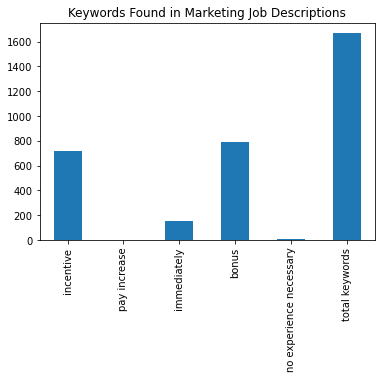

In [50]:
mktng_keyword_compare[['incentive', 'pay increase', 'immediately', 'bonus', 'no experience necessary', 'total keywords']].sum().plot(kind='bar',
                                                                                                                            title='Keywords Found in Marketing Job Descriptions')
plt.show()

In [51]:
mktng_keyword_compare['total keywords'].sum()

1670.0

Try this website for better facetgrids <br>
https://seaborn.pydata.org/tutorial/axis_grids.html
https://www.geeksforgeeks.org/python-seaborn-facetgrid-method/

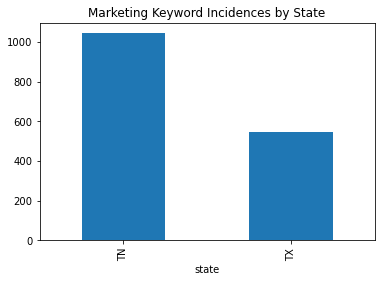

In [52]:
marketing3.groupby('state')['total keywords'].sum().plot(kind = 'bar', title = 'Marketing Keyword Incidences by State')
plt.show()

In [53]:
mktng_jobs = marketing3.to_csv('data/mktng_jobs.csv')

In [54]:


# def preprocess_text(job_snippet):
#     job_snippet = job_snippet.lower() # To lower
#     translator = str.maketrans('', '', string.punctuation)
#     job_snippet = job_snippet.translate(translator) # Removing punctuation
#     filtered_words = [w for w in job_snippet.split() if w not in stopwords.words('english')] # Removing stopwords from the tokenized text
#     return ' '.join(filtered_words) # returns the resulting list as a string

In [55]:
# KEYWORDS = ['bonus', 'bonuses', 'incentive', 'pay increase','training','immediately' ]

# def count_keywords(job_snippet):
#     counts = {}
#     prep = preprocess_text(job_snippet)
#     for kw in KEYWORDS:
#         counts[kw] = prep.count(kw)
#     return counts

In [56]:
# sum_incent = bluecollar3.drop(columns = ['title', 'job_snippet', 'location', 'full_description', 'min_pay', 'max_pay',
#                                         'occur_snippet', 'occur_full_desc'])
# sum_incent.sum(axis=0)